# EDA with ETNA (geospatial data)

## Andrey Alekseev

## Data description:
.csv file hold sample data for ride sharing app. 

Data consists of the following columns:
```
start_time - time when the order was made
start_lat - latitude of the location where the order was made
start_lng - longitude of the location where the order was made
end_lat - latitude of the destination point
end_lng - longitude of the destination point
ride_value - how much monetary value is in this particular ride
```

## EDA purpose description:

Availability of supply depends on the duration of time it takes for the drivers to reach the customers. It makes sense to attract drivers towards areas of highest anticipation and highest ride value. 

Check if it is possible to predict areas of high ride value using only the data available. 

## Summary of EDA:

- Filtered outliers based on geolocation;
- Clustered data based on geolocation;
- Rearranded data into 30 minutes intervals using the geolocation of the starting coordinates;
- Tried several models to predict results;

# EDA
## Load and validate the data
First, let's load the data and look at it.

The source data is 627210 rows of synthetic ride demand data which resembles the real-life situation in the city of Tallinn. The data seems to be only March 2022. Also there are no NaNs in the data. However maximum value of 3172 in ride_value column makes me think that it is outlier. I also can see geolocation as other source of outliers. I will check it later.

Also I will round start time to half hour intervals. It seems reasonable, since rounding to 15 minutes intervals could require us to collect more data (off peak hours especially) and 1 hour interval could be too general to predict demand in the area. 

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

import seaborn as sns
import datetime
import matplotlib.pyplot as plt

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [2]:
df = pd.read_csv('../data/ride_data.csv')
df.head(10)

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value
0,2022-03-06 15:02:39.329452000,59.407910,24.689836,59.513027,24.831630,3.51825
1,2022-03-10 11:15:55.177526000,59.441650,24.762712,59.426450,24.783076,0.50750
2,2022-03-06 14:23:33.893257000,59.435404,24.749795,59.431901,24.761588,0.19025
3,2022-03-03 09:11:59.104192000,59.406920,24.659006,59.381093,24.641652,0.75600
4,2022-03-06 00:13:01.290346000,59.434940,24.753641,59.489203,24.876170,2.27100
5,2022-03-02 07:17:34.858783000,59.433606,24.712736,59.435205,24.748843,0.50275
6,2022-03-17 11:08:25.117959000,59.398960,24.710864,59.440976,24.760222,1.35200
7,2022-03-18 14:34:56.333676000,59.416808,24.799002,59.406496,24.683917,1.62200
8,2022-03-13 19:19:32.659761000,59.432321,24.760523,59.423296,24.749209,0.29550
9,2022-03-17 16:20:20.028387000,59.410783,24.721219,59.439901,24.771756,1.06975


In [3]:
df.describe()

,start_lat,start_lng,end_lat,end_lng,ride_value
count,627210.000000,627210.000000,627210.000000,627210.000000,627210.000000
mean,59.428682,24.743468,59.397797,24.724847,2.261384
std,0.021764,0.056872,1.392755,1.650709,44.889892
min,59.321557,24.505199,-37.819979,-122.453962,0.107628
25%,59.418803,24.713140,59.415215,24.707919,0.545250
50%,59.432069,24.744674,59.430697,24.744335,1.059000
75%,59.439024,24.768115,59.439262,24.773924,1.712000
max,59.566998,24.973743,61.552744,144.966110,3172.701000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 627210 entries, 0 to 627209
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   start_time  627210 non-null  object 
 1   start_lat   627210 non-null  float64
 2   start_lng   627210 non-null  float64
 3   end_lat     627210 non-null  float64
 4   end_lng     627210 non-null  float64
 5   ride_value  627210 non-null  float64
dtypes: float64(5), object(1)
memory usage: 28.7+ MB


In [5]:
df["start_time"] = pd.to_datetime(df["start_time"])
print(f"Dataset's min timestamp: {df.start_time.min()}; Max timestamp: {df.start_time.max()}")

Dataset's min timestamp: 2022-03-01 00:00:07.936317; Max timestamp: 2022-03-28 23:59:53.175658


In [6]:
df['timestamp'] = df['start_time'].apply(lambda dt: datetime.datetime(dt.year, dt.month, dt.day, dt.hour, 
                                                                      30*(dt.minute // 30)))
df.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,timestamp
0,2022-03-06 15:02:39.329452,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06 15:00:00
1,2022-03-10 11:15:55.177526,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10 11:00:00
2,2022-03-06 14:23:33.893257,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06 14:00:00
3,2022-03-03 09:11:59.104192,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03 09:00:00
4,2022-03-06 00:13:01.290346,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06 00:00:00


## Outliers

As I said earlier I want to deal with outliers for `ride_value` column and geolocation columns.

For `ride_value` I delete everything that lying beyond 99th quantile. 

For geolocation columns I will check whenever the point (either starting or ending) is part of the sea. All the sea points should be deleted.

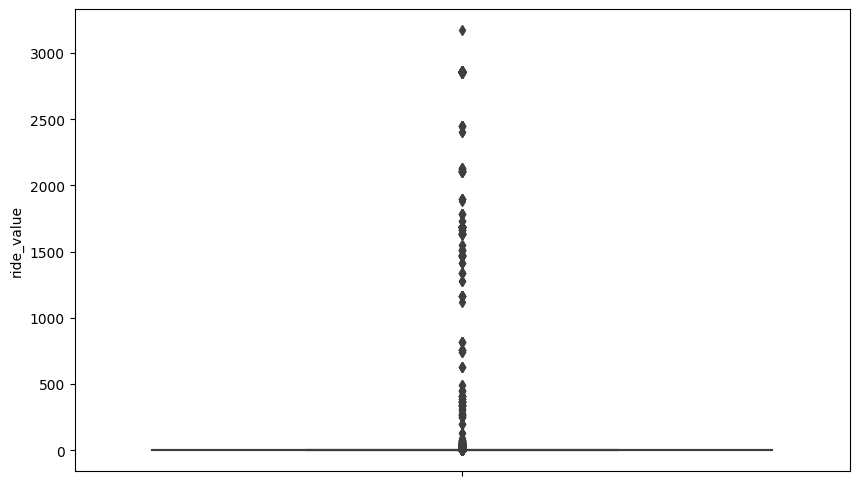

In [7]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot(y="ride_value", data = df)

In [8]:
df = df[df.ride_value <= df.ride_value.quantile(0.99)]

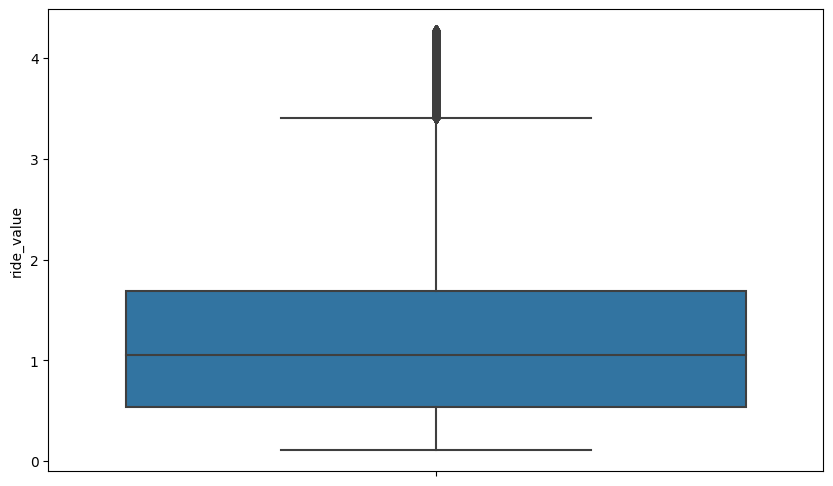

In [9]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot(y="ride_value", data = df)

In [10]:
from global_land_mask import globe

df["is_sea"] = df.parallel_apply(lambda x: globe.is_ocean(x["start_lat"], x["start_lng"]) or globe.is_ocean(x["end_lat"], x["end_lng"]), axis=1)
df["is_sea"].value_counts()

False    617137
True       3803
Name: is_sea, dtype: int64

In [11]:
df = df[~df['is_sea']]
df = df.drop(columns=["is_sea"])
df.head(10)

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,timestamp
0,2022-03-06 15:02:39.329452,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06 15:00:00
1,2022-03-10 11:15:55.177526,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10 11:00:00
2,2022-03-06 14:23:33.893257,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06 14:00:00
3,2022-03-03 09:11:59.104192,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03 09:00:00
4,2022-03-06 00:13:01.290346,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06 00:00:00
5,2022-03-02 07:17:34.858783,59.433606,24.712736,59.435205,24.748843,0.50275,2022-03-02 07:00:00
6,2022-03-17 11:08:25.117959,59.398960,24.710864,59.440976,24.760222,1.35200,2022-03-17 11:00:00
7,2022-03-18 14:34:56.333676,59.416808,24.799002,59.406496,24.683917,1.62200,2022-03-18 14:30:00
8,2022-03-13 19:19:32.659761,59.432321,24.760523,59.423296,24.749209,0.29550,2022-03-13 19:00:00
9,2022-03-17 16:20:20.028387,59.410783,24.721219,59.439901,24.771756,1.06975,2022-03-17 16:00:00


## Geolocation clustering

I want to aggreate data into clusters, since I want to predict demand based on the location. This could be done in several ways:
1. Uber h3.
2. Clustering algorithms.
3. Handmade distict boundaries.

I will try first two approaches, since the idea is to check out if idea is valuable and not to create the best possible solution. I will summarize ride_values based on time and cluster, because I want to predict overall demand in the locations. To choose the best clustering algorithm I will use Prophet model, because this model seems to be a good baseline for time series forecasting problems. 

To conduct forecasting task I will use ETNA library that allows me easily create pipeline to handle forecasting for several clusters and also apply time series cross validation techniques to my dataset automatically calculating metrics for each cluster.

In [12]:
import folium
import h3
from etna.datasets import TSDataset
from etna.transforms import TimeSeriesImputerTransform
from etna.models import ProphetModel
from etna.pipeline import Pipeline
from etna.metrics import SMAPE, MAE

tallinn_center =  (59.437425 , 24.745137)
pick_up_map = folium.Map(location=tallinn_center, zoom_start=12)

locationlist = df[["start_lat", "start_lng"]].values.tolist()
for point in range(0, len(locationlist), 1000):
    folium.Marker(locationlist[point]).add_to(pick_up_map)

pick_up_map

### Uber H3
Uber H3 is method and open source library introduced by Uber that is useful for analyzing large spatial data sets, partitioning areas of the Earth into hierarchial hexagon grid cells. Uber uses it for optimizing ride pricing and dispatch, visualizing and exploring spatial datasets. The purpose of the library perfectly fits my task. So I give it a go!

In [25]:
df_h3 = df.copy()
df_h3['h6'] = df_h3.parallel_apply(lambda x : h3.geo_to_h3(x.start_lat, x.start_lng, 6), axis = 1)
df_h3.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,timestamp,h6
0,2022-03-06 15:02:39.329452,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06 15:00:00,86089bc5fffffff
1,2022-03-10 11:15:55.177526,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10 11:00:00,86089b1a7ffffff
2,2022-03-06 14:23:33.893257,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06 14:00:00,86089b1a7ffffff
3,2022-03-03 09:11:59.104192,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03 09:00:00,86089bc5fffffff
4,2022-03-06 00:13:01.290346,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06 00:00:00,86089b1a7ffffff


In [26]:
df_h3 = df_h3[["h6", 'ride_value', 'timestamp']].groupby(["h6", 'timestamp']).sum().reset_index()
df_h3.head()

,h6,timestamp,ride_value
0,86089b017ffffff,2022-03-01 07:30:00,3.28600
1,86089b017ffffff,2022-03-03 11:00:00,3.01675
2,86089b017ffffff,2022-03-04 20:00:00,2.99350
3,86089b017ffffff,2022-03-06 22:00:00,2.82150
4,86089b017ffffff,2022-03-07 20:00:00,4.08900


To use ETNA library I have to do so adjustments to column names.

In [103]:
df_etna_h3 = df_h3.rename(columns={"h6": "segment", "ride_value": "target"})
df_etna_h3.head()

,segment,timestamp,target
0,86089b017ffffff,2022-03-01 07:30:00,3.28600
1,86089b017ffffff,2022-03-03 11:00:00,3.01675
2,86089b017ffffff,2022-03-04 20:00:00,2.99350
3,86089b017ffffff,2022-03-06 22:00:00,2.82150
4,86089b017ffffff,2022-03-07 20:00:00,4.08900


In [128]:
ts = TSDataset(TSDataset.to_dataset(df_etna_h3), freq="30T")
imputer = TimeSeriesImputerTransform(strategy="forward_fill")
ts.fit_transform([imputer])
ts = TSDataset(ts.to_pandas().fillna(0), freq="30T")
ts.head()

segment,86089b017ffffff,86089b037ffffff,86089b0a7ffffff,86089b11fffffff,86089b187ffffff,86089b18fffffff,86089b197ffffff,86089b19fffffff,86089b1a7ffffff,86089b1afffffff,...,86089bc47ffffff,86089bc4fffffff,86089bc57ffffff,86089bc5fffffff,86089bc67ffffff,86089bc77ffffff,86089bcc7ffffff,86089bccfffffff,86089bce7ffffff,86089bcefffffff
feature,target,target,target,target,target,target,target,target,target,target,...,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-03-01 00:00:00,0.0,2.8855,0.0,0.0,20.13300,11.0530,0.00000,4.0545,181.14700,6.56075,...,10.23375,0.00000,4.68950,60.87350,0.0,0.0,0.0,0.00000,0.0,4.930
2022-03-01 00:30:00,0.0,6.8010,0.0,0.0,30.70725,10.8285,1.47125,2.0225,155.81000,5.77200,...,6.30725,3.71025,4.84650,41.55050,0.0,0.0,0.0,0.00000,0.0,14.352
2022-03-01 01:00:00,0.0,6.8010,0.0,0.0,15.06550,3.3355,1.47125,2.0225,194.27200,5.84650,...,6.56725,3.71025,4.65925,35.12425,0.0,0.0,0.0,1.88375,0.0,10.218
2022-03-01 01:30:00,0.0,6.8010,0.0,0.0,12.98850,3.6520,5.25250,3.6040,149.20050,6.05425,...,8.37950,9.15875,4.65925,39.33950,0.0,0.0,0.0,1.88375,0.0,1.906
2022-03-01 02:00:00,0.0,6.8010,0.0,0.0,17.92625,3.8600,1.46875,2.5040,131.87875,5.93900,...,8.37950,1.40150,8.98300,48.92275,0.0,0.0,0.0,1.88375,0.0,5.441


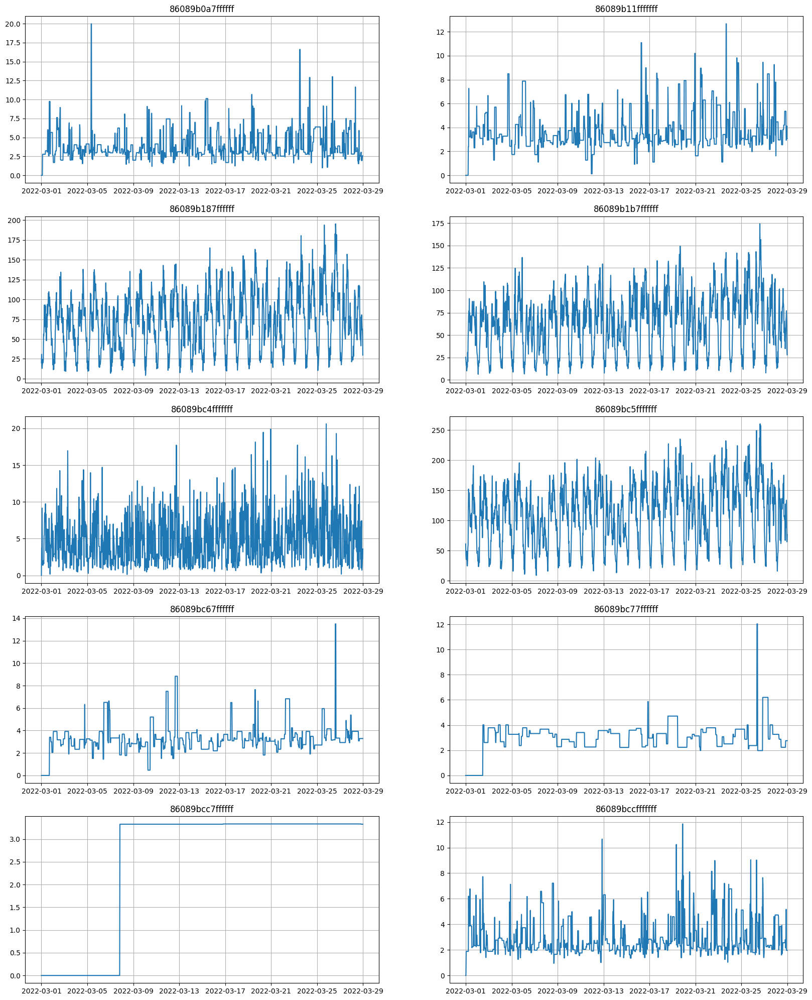

In [129]:
ts.plot()

Some clusters are really small and have almost no data, however I will continue the experiment.

I will use Prophet model to predict clusters 7 days in advance. Then I will sum the prediction and compare real values and predicted values.

In [130]:
# This will silence excessive Prophet logging
import logging
logging.getLogger("prophet").setLevel(logging.CRITICAL)
logging.getLogger("cmdstanpy").setLevel(logging.CRITICAL)

prophet_model = ProphetModel(n_changepoints=3, yearly_seasonality=False, weekly_seasonality=True, 
                             daily_seasonality=True)
pipe = Pipeline(model=prophet_model, horizon=48)
prophet_result = pipe.backtest(ts, metrics=[SMAPE(), MAE()], n_folds=7, n_jobs=8)

[Parallel(n_jobs=8)]: Using backend MultiprocessingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   1 tasks      | elapsed:   32.8s
[Parallel(n_jobs=8)]: Done   2 out of   7 | elapsed:   34.3s remaining:  1.4min
[Parallel(n_jobs=8)]: Done   3 out of   7 | elapsed:   35.4s remaining:   47.2s
[Parallel(n_jobs=8)]: Done   4 out of   7 | elapsed:   36.3s remaining:   27.3s
[Parallel(n_jobs=8)]: Done   5 out of   7 | elapsed:   36.8s remaining:   14.7s
[Parallel(n_jobs=8)]: Done   7 out of   7 | elapsed:   37.5s remaining:    0.0s
[Parallel(n_jobs=8)]: Done   7 out of   7 | elapsed:   37.5s finished


In [131]:
def compare_commulative_metric(real, predicted, metric):
    """Calculates matrics on summarization of all segments."""
    min_date_time = str(predicted.index.min().date())
    real_df = TSDataset.to_flatten(real[min_date_time:, ...])
    real_df = real_df.groupby("timestamp").sum()
    real_df["segment"] = "SUMMARIZATION_OF_ALL_SEGMENTS_METRIC_" + metric.name
    real_df = real_df.reset_index()
    
    idx = pd.IndexSlice
    
    predicted_df = predicted.loc[idx[:], idx[:, "target"]]
    predicted_df = TSDataset.to_flatten(predicted_df)
    predicted_df = predicted_df.groupby("timestamp").sum()
    predicted_df["segment"] = "SUMMARIZATION_OF_ALL_SEGMENTS_METRIC_" + metric.name
    predicted_df = predicted_df.reset_index()
    
    return metric(TSDataset(TSDataset.to_dataset(real_df), freq="30T"), 
                  TSDataset(TSDataset.to_dataset(predicted_df), freq="30T"))

In [132]:
compare_commulative_metric(ts, prophet_result[1], SMAPE())

{'SUMMARIZATION_OF_ALL_SEGMENTS_METRIC_SMAPE': 14.206348255112774}

In [133]:
compare_commulative_metric(ts, prophet_result[1], MAE())

{'SUMMARIZATION_OF_ALL_SEGMENTS_METRIC_MAE': 85.7555804276805}

### Clustering
For clustering I will use simple KMeans model just to validate results from Uber H3 algorithm.

In [134]:
from sklearn.cluster import MiniBatchKMeans, KMeans

In [135]:
coord = df[df["timestamp"] < "2022-03-22 00:00:00"][['start_lat', 'start_lng']].values
regions = MiniBatchKMeans(n_clusters = 10, batch_size = 10000).fit(coord)

In [136]:
df_cl = df.copy()
df_cl["region"] = regions.predict(df_cl[['start_lat', 'start_lng']].values)
df_cl.head()

,start_time,start_lat,start_lng,end_lat,end_lng,ride_value,timestamp,region
0,2022-03-06 15:02:39.329452,59.407910,24.689836,59.513027,24.831630,3.51825,2022-03-06 15:00:00,1
1,2022-03-10 11:15:55.177526,59.441650,24.762712,59.426450,24.783076,0.50750,2022-03-10 11:00:00,0
2,2022-03-06 14:23:33.893257,59.435404,24.749795,59.431901,24.761588,0.19025,2022-03-06 14:00:00,7
3,2022-03-03 09:11:59.104192,59.406920,24.659006,59.381093,24.641652,0.75600,2022-03-03 09:00:00,5
4,2022-03-06 00:13:01.290346,59.434940,24.753641,59.489203,24.876170,2.27100,2022-03-06 00:00:00,7


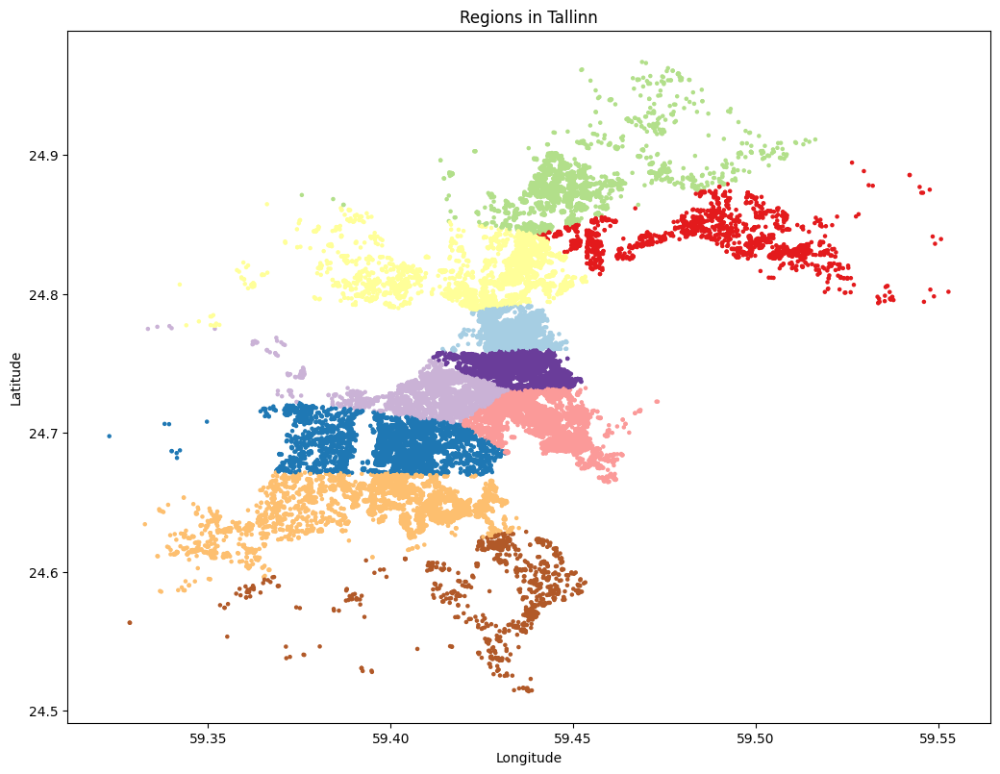

In [137]:
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_axes([0,0,1.5,1.5])
ax.scatter(x = df_cl.start_lat.values[:70000], y = df_cl.start_lng.values[:70000], c = df_cl.region.values[:70000], cmap = "Paired", s = 5)
ax.set_title("Regions in Tallinn")
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

In [138]:
df_cl = df_cl[["region", 'ride_value', 'timestamp']].groupby(["region", 'timestamp']).sum().reset_index()
df_etna_cl = df_cl.rename(columns={"region": "segment", "ride_value": "target"})
ts = TSDataset(TSDataset.to_dataset(df_etna_cl), freq="30T")
imputer = TimeSeriesImputerTransform(strategy="forward_fill")
ts.fit_transform([imputer])
ts = TSDataset(ts.to_pandas(), freq="30T")
ts.head()

segment,0,1,2,3,4,5,6,7,8,9
feature,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,
2022-03-01 00:00:00,25.55775,36.69175,17.91250,35.75325,13.05925,31.66075,18.87125,133.61150,11.83325,10.23375
2022-03-01 00:30:00,19.95975,20.06875,19.07475,20.98025,19.80575,39.67000,11.93150,128.20275,20.37725,6.30725
2022-03-01 01:00:00,19.71650,22.95050,3.91175,28.30975,9.04700,25.40125,16.15550,149.98025,12.50250,5.39925
2022-03-01 01:30:00,19.00475,12.56000,10.15150,32.39075,6.05425,25.53100,6.15550,127.25825,13.35175,6.70000
2022-03-01 02:00:00,11.64625,30.14325,12.15375,22.01925,5.93900,31.34625,6.76625,105.63825,12.78625,6.70000


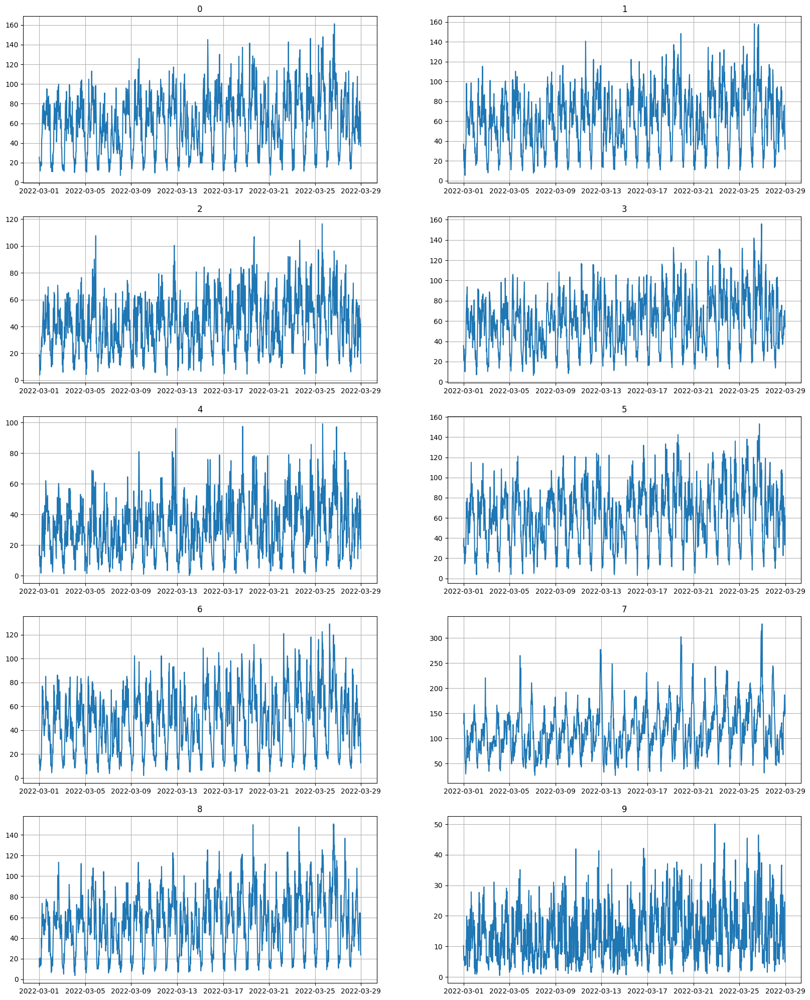

In [139]:
ts.plot()

I must admit, that clusters from KMeans look better in terms of quality of time series than Uber H3.

In [140]:
prophet_model = ProphetModel(n_changepoints=3, yearly_seasonality=False, weekly_seasonality=True, 
                             daily_seasonality=True)
pipe = Pipeline(model=prophet_model, horizon=48)
prophet_result_kmeans = pipe.backtest(ts, metrics=[SMAPE(), MAE()], n_folds=7, n_jobs=8)

[Parallel(n_jobs=8)]: Using backend MultiprocessingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   1 tasks      | elapsed:   15.2s
[Parallel(n_jobs=8)]: Done   2 out of   7 | elapsed:   15.8s remaining:   39.4s
[Parallel(n_jobs=8)]: Done   3 out of   7 | elapsed:   17.0s remaining:   22.6s
[Parallel(n_jobs=8)]: Done   4 out of   7 | elapsed:   17.2s remaining:   12.9s
[Parallel(n_jobs=8)]: Done   5 out of   7 | elapsed:   17.2s remaining:    6.9s
[Parallel(n_jobs=8)]: Done   7 out of   7 | elapsed:   18.4s remaining:    0.0s
[Parallel(n_jobs=8)]: Done   7 out of   7 | elapsed:   18.4s finished


In [141]:
compare_commulative_metric(ts, prophet_result_kmeans[1], SMAPE())

{'SUMMARIZATION_OF_ALL_SEGMENTS_METRIC_SMAPE': 15.09280229508125}

In [142]:
compare_commulative_metric(ts, prophet_result_kmeans[1], MAE())

{'SUMMARIZATION_OF_ALL_SEGMENTS_METRIC_MAE': 85.67945877061152}

Turns out that h3 aggregation performs better in terms of metrics. So I am going to use it for now.

It may happen because we have several locations with high activity (near the city center for example) and the model based on KMeans clusters have managed to predict it well, however failing on rural areas due to the lack of data. This must be researched in the future.

Also I want to plot some additional plots to analise the time series data.

From the plots below I can see that there is no detectable trend in the time series. So we may not take it into account for MVP model.However we should take a look at previous 30 minute lag, yesterday lag and last week lags. Because as ACF and PACF plots suggest the ride_value may be impacted by it and it will allow us to make better predictions.

In [143]:
ts = TSDataset(TSDataset.to_dataset(df_etna_h3), freq="30T")
imputer = TimeSeriesImputerTransform(strategy="forward_fill")
ts.fit_transform([imputer])
ts = TSDataset(ts.to_pandas(), freq="30T")

In [144]:
from etna.analysis import sample_acf_plot, sample_pacf_plot, plot_trend

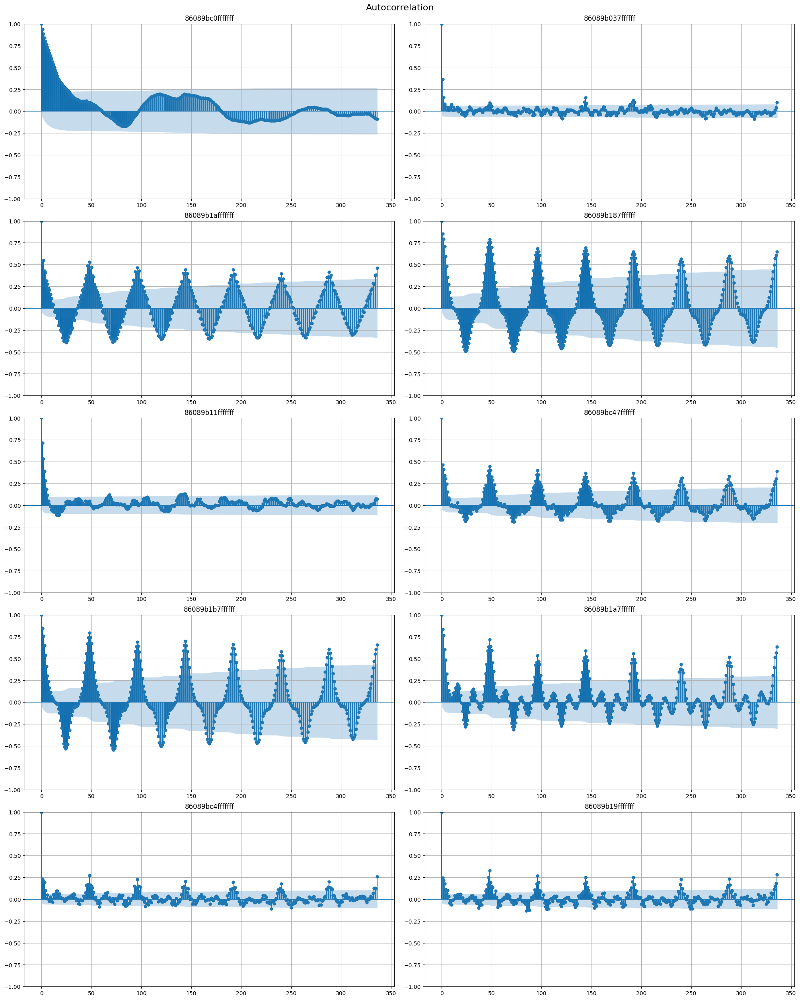

In [145]:
sample_acf_plot(ts, lags=336)

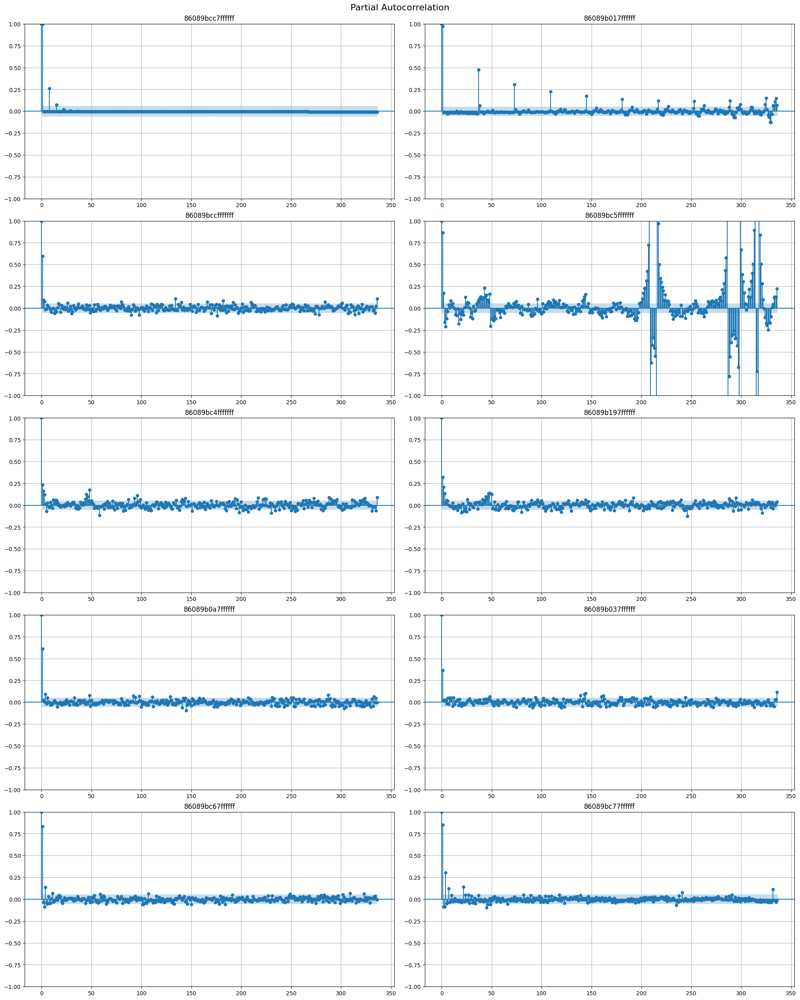

In [146]:
sample_pacf_plot(ts, lags=336)

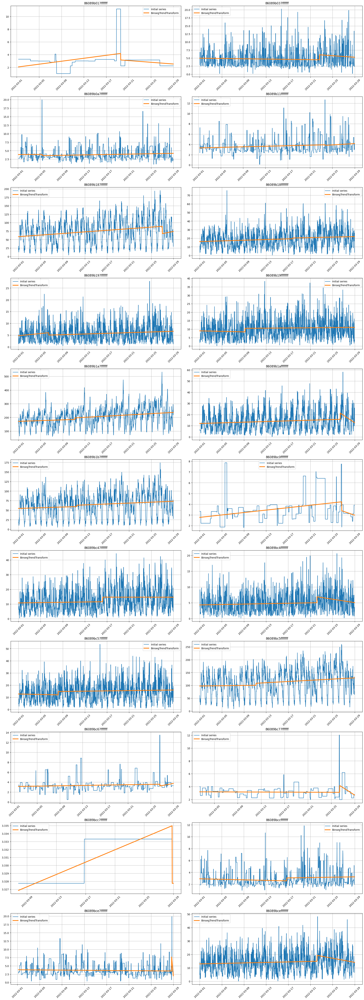

In [147]:
from etna.transforms import BinsegTrendTransform

plot_trend(ts, BinsegTrendTransform(in_column="target", n_bkps=1))

## Forecasting

Since the purpose of this task is to explore the data and possible solutions that we can use later as staring point for developing MVP, I will not set up SARIMAX model for each time series. I will try two different approaches. The first one is to use ensemble of naive models and the second one is boosting. 

I will predict 1 day in advance (48 point in future). For backtesting period I will use 1 week.

For ensemble creation I will stick to using ETNA library.

In [153]:
from etna.models import HoltWintersModel, NaiveModel, MovingAverageModel, SeasonalMovingAverageModel
from etna.ensembles import VotingEnsemble
from etna.analysis import plot_backtest, plot_backtest_interactive

sma_7 = Pipeline(model=SeasonalMovingAverageModel(window=7, seasonality=48), horizon=48)
sma_14 = Pipeline(model=SeasonalMovingAverageModel(window=7, seasonality=96), horizon=48)
naive_48 = Pipeline(model=NaiveModel(lag=48), horizon=48)
naive_1w = Pipeline(model=NaiveModel(lag=336), horizon=48)

ens_of_simple_models = VotingEnsemble(weights="auto", pipelines=[naive_48, naive_1w, sma_7, sma_14])

In [150]:
ens_result = ens_of_simple_models.backtest(ts, metrics=[SMAPE(), MAE()], n_folds=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | el

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   13.7s remainin

In [151]:
ens_result[0].groupby("segment").mean()

,SMAPE,MAE,fold_number
segment,,,
86089b017ffffff,32.056017,0.916860,1.0
86089b037ffffff,49.504190,2.802484,1.0
86089b0a7ffffff,30.466653,1.244873,1.0
86089b11fffffff,35.673204,1.558136,1.0
86089b187ffffff,20.260976,15.419022,1.0
86089b18fffffff,36.491813,6.114935,1.0
86089b197ffffff,48.819551,2.698189,1.0
86089b19fffffff,44.080503,4.165775,1.0
86089b1a7ffffff,15.225081,34.769218,1.0


In [154]:
plot_backtest_interactive(ens_result[1], ts, history_len=48, segments=ts.segments)

As we can see, some time series predicted with plausible results. This applies first of all to big regions.

Now let's try boosing model.

In [155]:
from etna.pipeline import Pipeline
from etna.models import CatBoostModelMultiSegment
from etna.transforms import LagTransform, HolidayTransform, FourierTransform, \
DateFlagsTransform, TimeFlagsTransform, MeanSegmentEncoderTransform, MeanTransform, LinearTrendTransform
from etna.metrics import SMAPE, MAE

In [156]:
model = CatBoostModelMultiSegment()
lag_feat = LagTransform(in_column="target", lags=[i for i in range(48, 96)], out_column="regressor_lag")
lag_1w_feat = LagTransform(in_column="target", lags=[i for i in range(336, 336+48)], out_column="regressor_lag")
fourier_tr = FourierTransform(period=48, mods=[1,2])
mean_seg_tr = MeanSegmentEncoderTransform()
date_tr = DateFlagsTransform(
    day_number_in_week=True,
    day_number_in_month=False,
    is_weekend=True,
    special_days_in_week=[4],
)
time_tr = TimeFlagsTransform(
    minute_in_hour_number=False,
    half_hour_number=True,
    half_day_number=True,
    one_third_day_number=True,
)
mean_1d = MeanTransform(in_column="regressor_lag_48", window=48)
mean_same_hour = MeanTransform(in_column="regressor_lag_48", window=7, seasonality=48)
mean_1w = MeanTransform(in_column="regressor_lag_48", window=336)
trend_tr = LinearTrendTransform(in_column="target")
hol_tr = HolidayTransform(iso_code="EE")
pipe = Pipeline(model=model, 
                transforms=[trend_tr, lag_feat, lag_1w_feat, mean_seg_tr, date_tr, 
                            time_tr, mean_1d, mean_1w, hol_tr], 
                horizon=48)

In [157]:
result = pipe.backtest(ts, metrics=[SMAPE(), MAE()], n_folds=3, n_jobs=8)

[Parallel(n_jobs=8)]: Using backend MultiprocessingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   1 tasks      | elapsed:   39.7s
[Parallel(n_jobs=8)]: Done   3 out of   3 | elapsed:   40.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done   3 out of   3 | elapsed:   40.1s finished


In [158]:
result[0].groupby("segment").mean()

,SMAPE,MAE,fold_number
segment,,,
86089b017ffffff,39.625610,1.214494,1.0
86089b037ffffff,48.660527,2.770381,1.0
86089b0a7ffffff,35.758492,1.443947,1.0
86089b11fffffff,26.673381,1.149414,1.0
86089b187ffffff,15.939993,10.876270,1.0
86089b18fffffff,33.813414,6.067335,1.0
86089b197ffffff,45.972694,2.504776,1.0
86089b19fffffff,42.910996,4.123875,1.0
86089b1a7ffffff,9.609055,21.266167,1.0


In [160]:
plot_backtest_interactive(result[1], ts, history_len=48)

As I can see I have managed to impove the metrics in big regions. However small regions still behave badly.

Further work can be:
- Rearrange the regions
- Collect more data on small regions
- Try ensemble of models